![tracker](https://us-central1-vertex-ai-mlops-369716.cloudfunctions.net/pixel-tracking?path=statmike%2Fvertex-ai-mlops%2FApplied+GenAI%2FGenerate&file=Gemini+For+Vision+-+Classification+and+Detection.ipynb)
<!--- header table --->
<table align="left">
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Applied%20GenAI/Generate/Gemini%20For%20Vision%20-%20Classification%20and%20Detection.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/colab-logo-32px.png" alt="Google Colaboratory logo">
      <br>Run in<br>Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https%3A%2F%2Fraw.githubusercontent.com%2Fstatmike%2Fvertex-ai-mlops%2Fmain%2FApplied%2520GenAI%2FGenerate%2FGemini%2520For%2520Vision%2520-%2520Classification%2520and%2520Detection.ipynb">
      <img width="32px" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" alt="Google Cloud Colab Enterprise logo">
      <br>Run in<br>Colab Enterprise
    </a>
  </td>      
  <td style="text-align: center">
    <a href="https://github.com/statmike/vertex-ai-mlops/blob/main/Applied%20GenAI/Generate/Gemini%20For%20Vision%20-%20Classification%20and%20Detection.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/github-logo-32px.png" alt="GitHub logo">
      <br>View on<br>GitHub
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?download_url=https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI/Generate/Gemini%20For%20Vision%20-%20Classification%20and%20Detection.ipynb">
      <img src="https://lh3.googleusercontent.com/UiNooY4LUgW_oTvpsNhPpQzsstV5W8F7rYgxgGBD85cWJoLmrOzhVs_ksK_vgx40SHs7jCqkTkCk=e14-rj-sc0xffffff-h130-w32" alt="Vertex AI logo">
      <br>Open in<br>Vertex AI Workbench
    </a>
  </td>
</table>

# Gemini For Vision - Classification and Detection

---
## Colab Setup

To run this notebook in Colab run the cells in this section.  Otherwise, skip this section.

This cell will authenticate to GCP (follow prompts in the popup).

In [11]:
PROJECT_ID = 'statmike-mlops-349915' # replace with project ID

In [12]:
try:
    from google.colab import auth
    auth.authenticate_user()
    !gcloud config set project {PROJECT_ID}
    print('Colab authorized to GCP')
except Exception:
    print('Not a Colab Environment')
    pass

Not a Colab Environment


---
## Installs

The list `packages` contains tuples of package import names and install names.  If the import name is not found then the install name is used to install quitely for the current user.

In [186]:
# tuples of (import name, install name, min_version)
packages = [
    ('google.cloud.aiplatform', 'google-cloud-aiplatform', '1.71.0'),
    ('google.genai', 'google-genai'),
    ('pydantic', 'pydantic'),
    ('PIL', 'Pillow'),
]

import importlib
install = False
for package in packages:
    if not importlib.util.find_spec(package[0]):
        print(f'installing package {package[1]}')
        install = True
        !pip install {package[1]} -U -q --user
    elif len(package) == 3:
        if importlib.metadata.version(package[0]) < package[2]:
            print(f'updating package {package[1]}')
            install = True
            !pip install {package[1]} -U -q --user

### API Enablement

In [14]:
!gcloud services enable aiplatform.googleapis.com

### Restart Kernel (If Installs Occured)

After a kernel restart the code submission can start with the next cell after this one.

In [15]:
if install:
    import IPython
    app = IPython.Application.instance()
    app.kernel.do_shutdown(True)
    IPython.display.display(IPython.display.Markdown("""<div class=\"alert alert-block alert-warning\">
        <b>⚠️ The kernel is going to restart. Please wait until it is finished before continuing to the next step. The previous cells do not need to be run again⚠️</b>
        </div>"""))

---
## Setup

inputs:

In [16]:
project = !gcloud config get-value project
PROJECT_ID = project[0]
PROJECT_ID

'statmike-mlops-349915'

In [17]:
REGION = 'us-central1'
SERIES = 'applied-genai'
EXPERIMENT = 'gemini-vision'

packages:

In [188]:
# standard packages
import os, shutil, io, base64, enum, typing, json

from IPython.display import display, HTML
import pydantic
import PIL, PIL.ImageFont, PIL.Image, PIL.ImageDraw

# vertex ai imports
from google.cloud import aiplatform
import vertexai
import vertexai.generative_models # for Gemini Models

# google gen ai sdk
from google import genai

In [19]:
aiplatform.__version__

'1.78.0'

In [20]:
genai.__version__

'1.0.0'

clients:

In [21]:
#vertexai.init(project = PROJECT_ID, location = REGION)
genai_client = genai.Client(vertexai = True, project = PROJECT_ID, location = REGION)

---
## Make Some Images!!!

The goal of this workflow is to classify images and detect objects in images.  Let's start by using Imagen to generate some images.

For this workflow we will create:
- images of sports balls: soccer, americal football, baseball, golf, basketball
- images with multiples
- images with mixtures of types

Sound good?  Let's go!

### A Single Sport

In [23]:
response = genai_client.models.generate_images(
    model = 'imagen-3.0-generate-002',
    prompt = f'An image from anywhere in the field of play for the sport of baseball where the primary subject of the image is the ball.',
    config = genai.types.GenerateImagesConfig(
        negative_prompt='humans and players',
        number_of_images = 4,
        include_rai_reason = True,
        output_mime_type = 'image/jpeg',
    ),
)


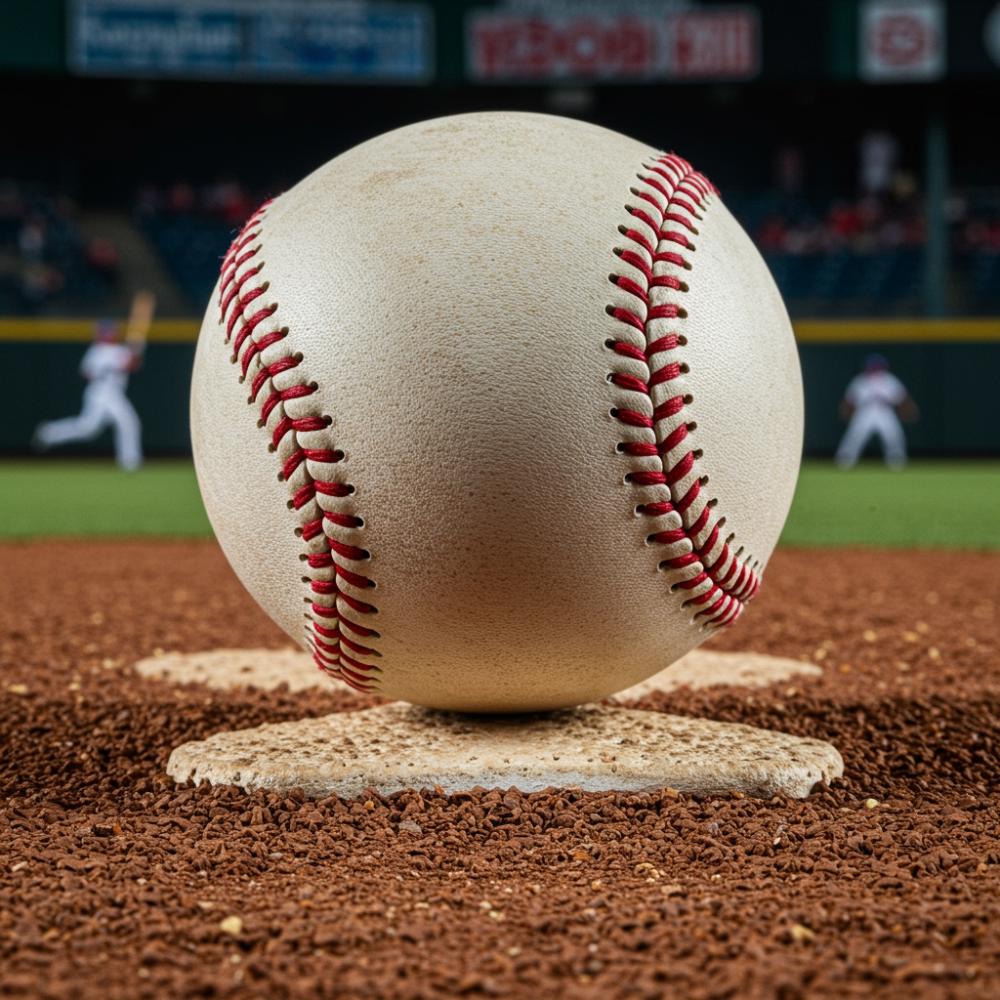
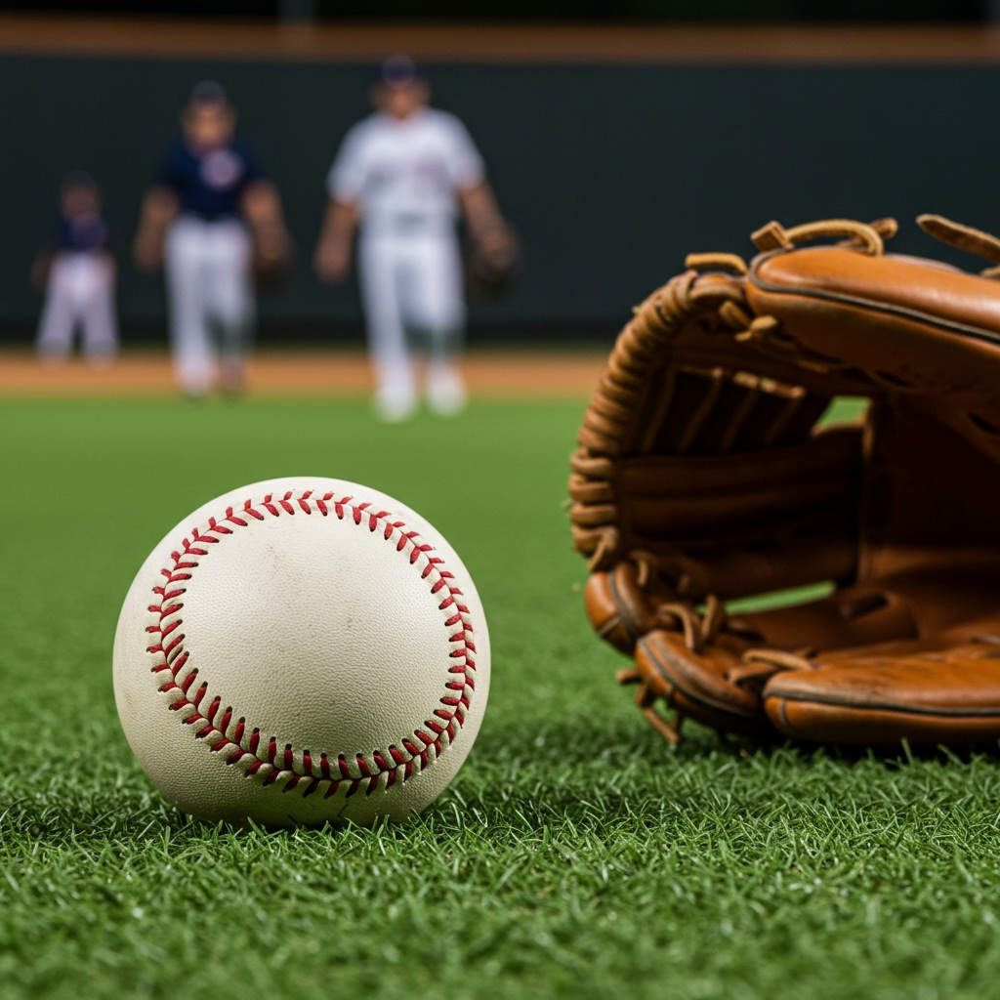
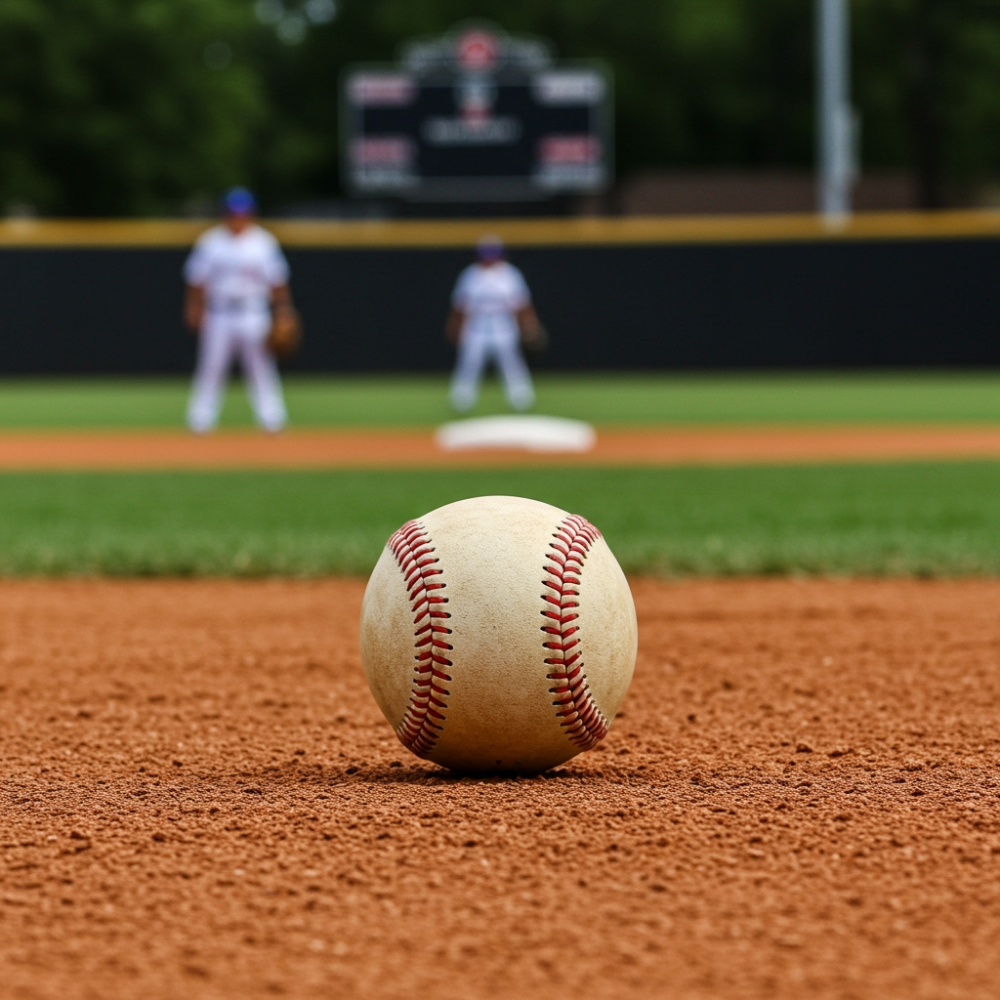
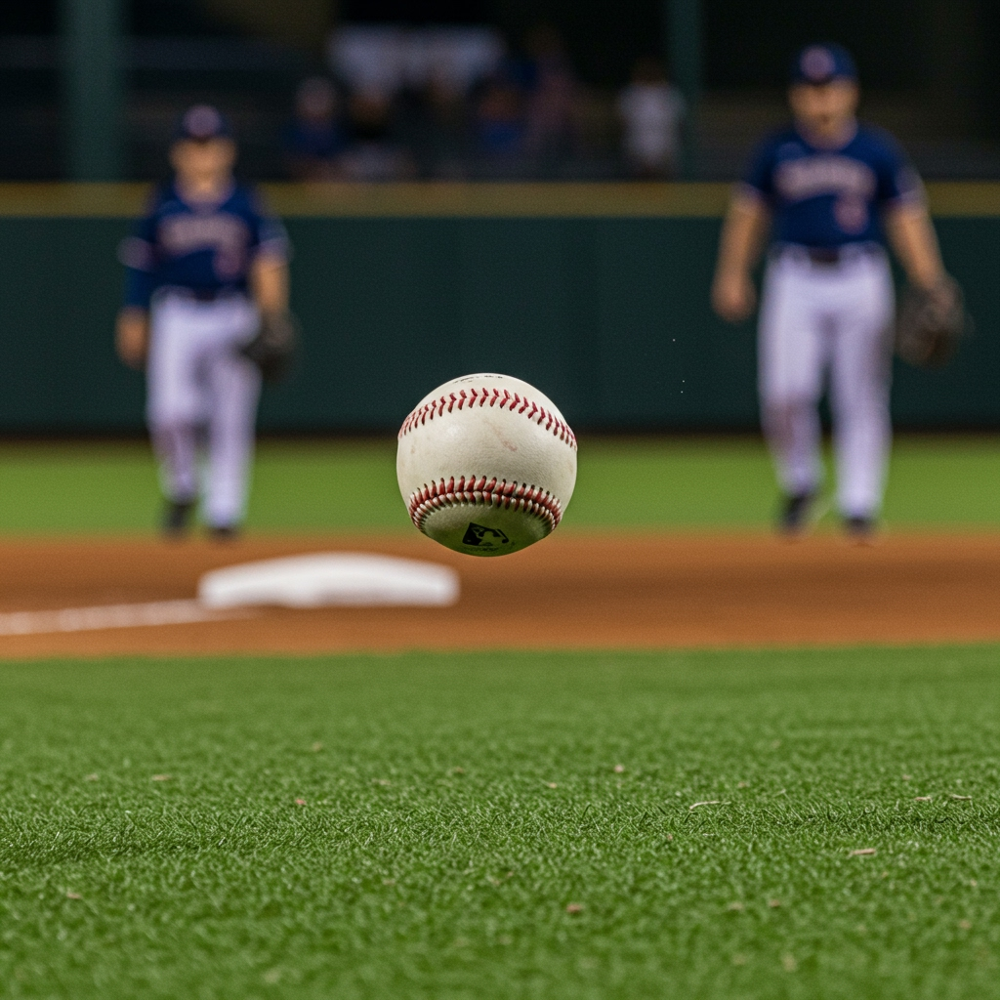

In [36]:
def display_images(images):
    html_content = "<div style='display: flex;'>"
    for image in images:
        buffered = io.BytesIO(image.image.image_bytes)
        img_str = base64.b64encode(buffered.read()).decode()
        html_content += f'<img src="data:image/jpeg;base64,{img_str}" style="margin: 0px 5px; width: 200px;"/>'
    html_content += "</div>"
    display(HTML(html_content))
    
display_images(response.generated_images)

### All Sports And Mixtures of Sports

In [64]:
ball_data = [
    {'types': ['baseball']},
    {'types': ['american football']},
    {'types': ['soccer']},
    {'types': ['basketball']},
    {'types': ['golf']},
    {'types': ['baseball', 'golf']},
    {'types': ['soccer', 'basketball']}
]

In [65]:
for ball in ball_data:
    
    ball_str = ', '.join(ball['types'])
    if len(ball['types']) == 1:
        prompt = f"An image of a ball from the sport of {ball_str}"
    else:
        prompt = f"An image containing a pair of balls from the following sports: {ball_str}"
    
    response = genai_client.models.generate_images(
        model = 'imagen-3.0-generate-002',
        prompt = prompt,
        config = genai.types.GenerateImagesConfig(
            negative_prompt='humans and players',
            number_of_images = 4,
            include_rai_reason = True,
            output_mime_type = 'image/jpeg',
        ),
    )
    ball['images'] = response.generated_images
    print(f"Generate images for: {ball_str}")

Generate images for: baseball
Generate images for: american football
Generate images for: soccer
Generate images for: basketball
Generate images for: golf
Generate images for: baseball, golf
Generate images for: soccer, basketball



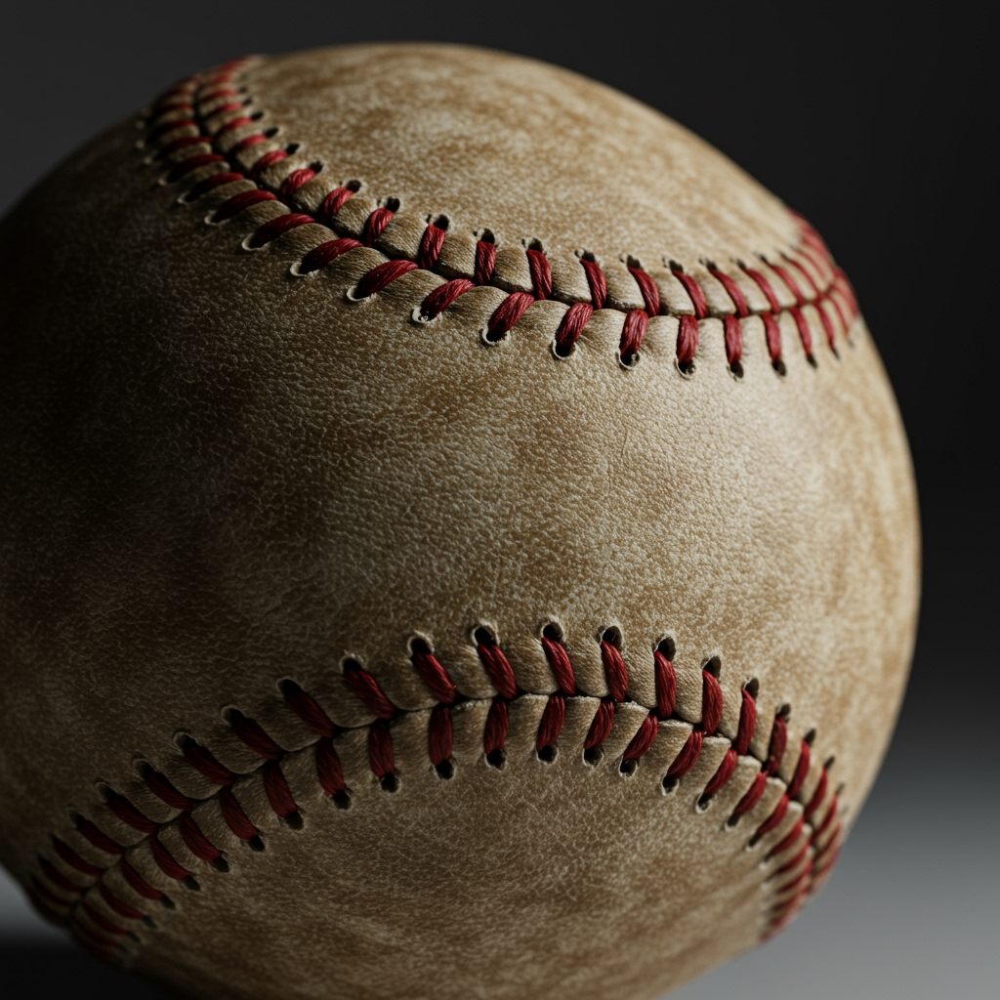
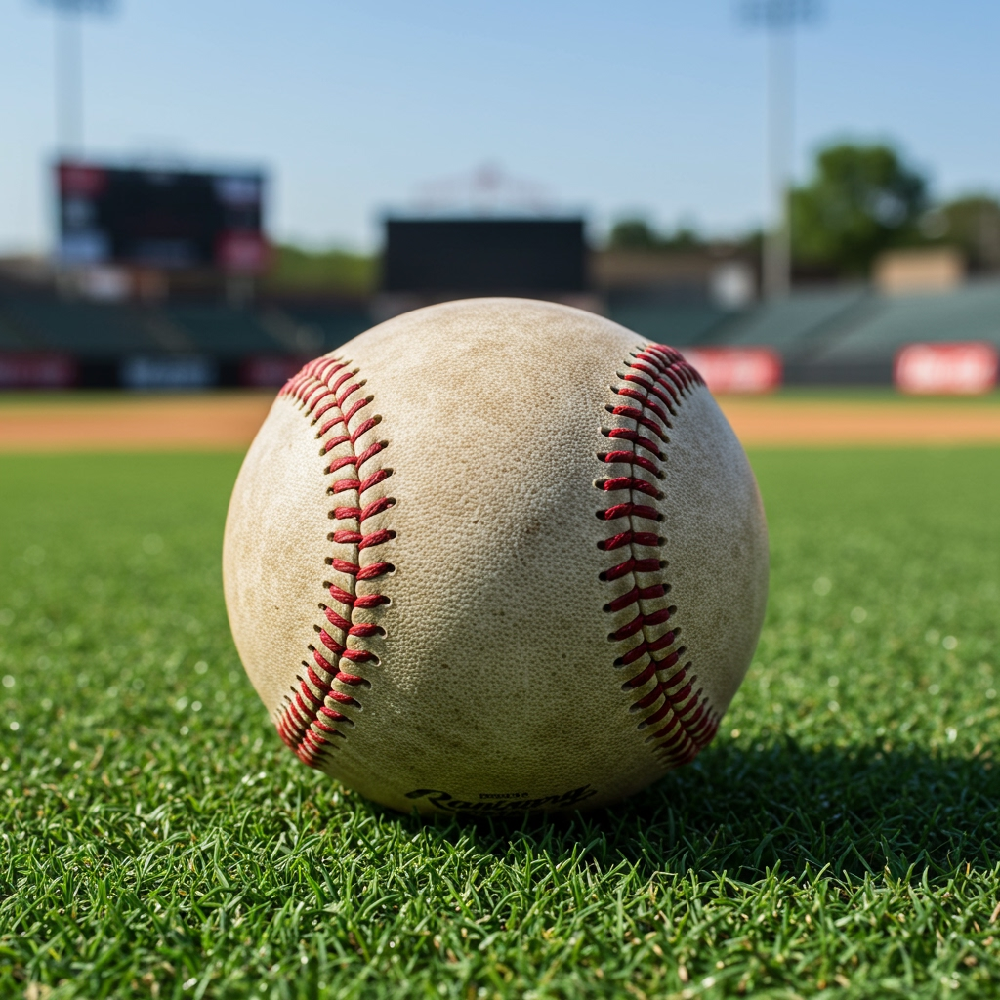
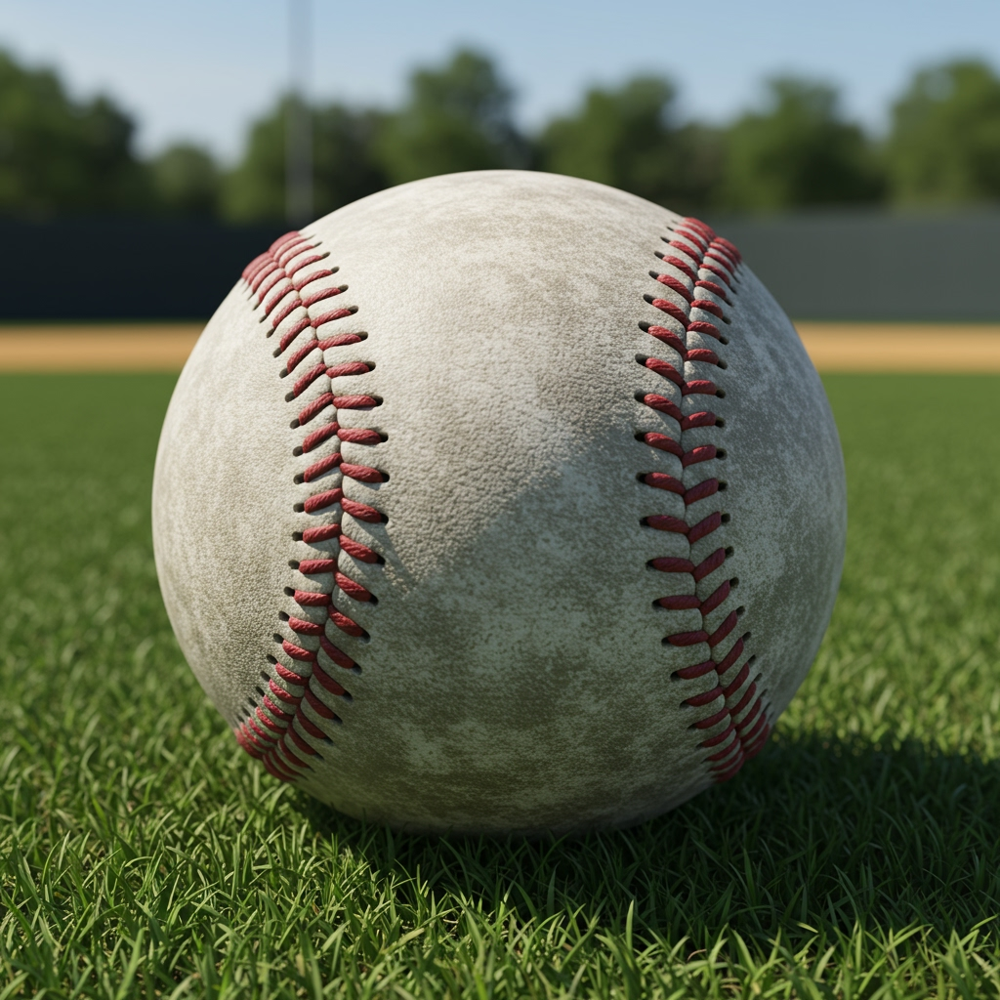
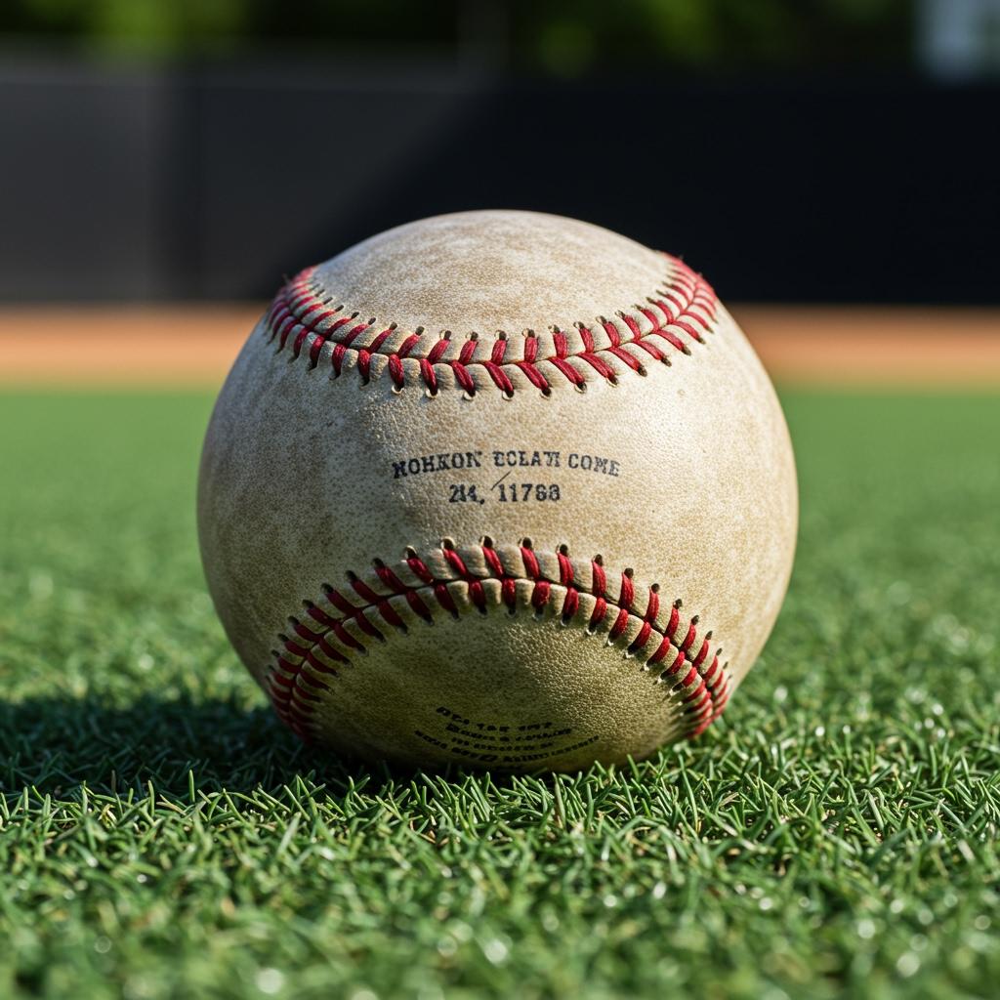


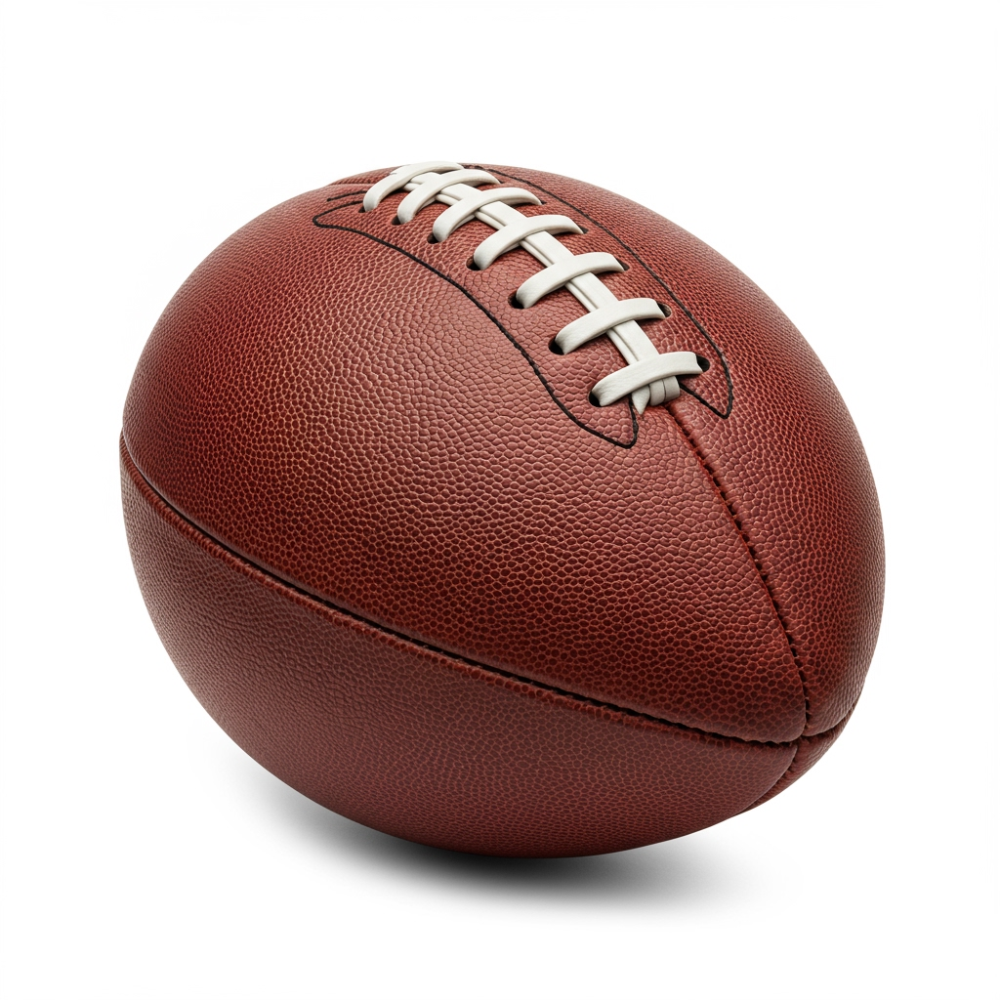
...
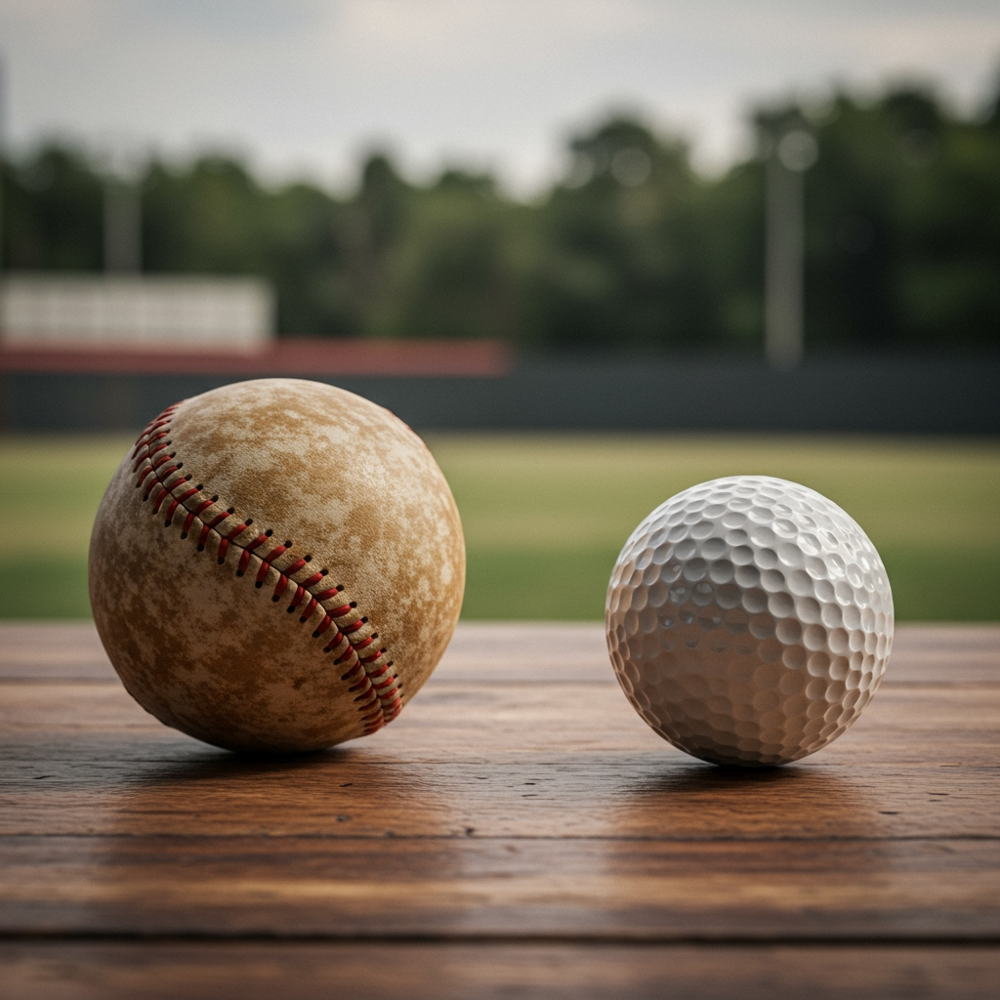


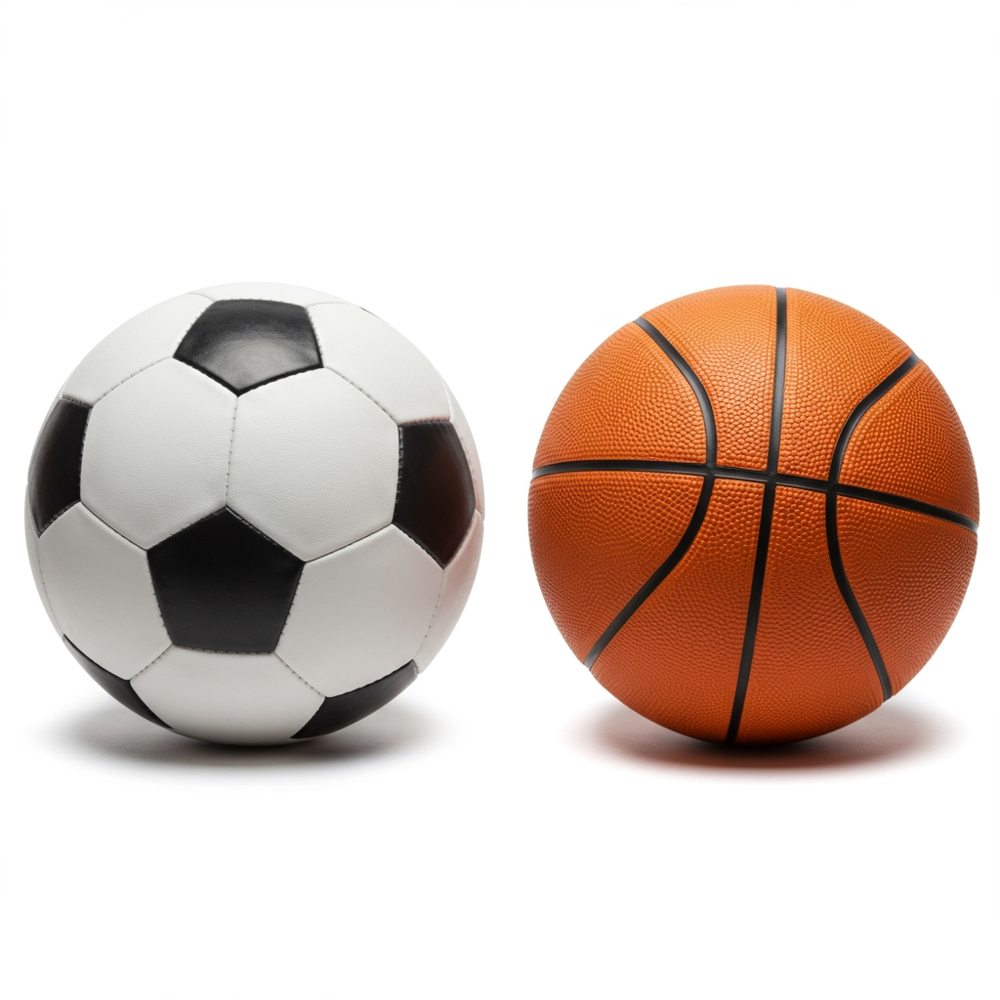
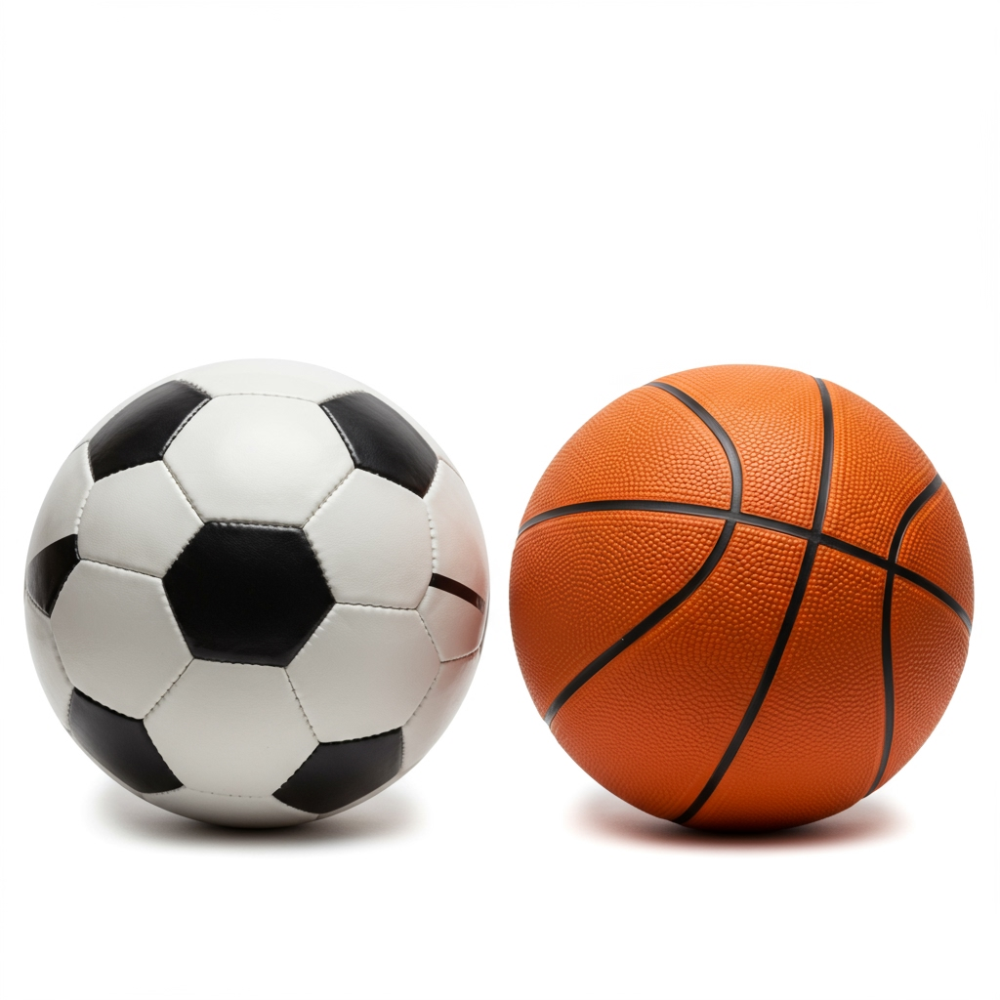
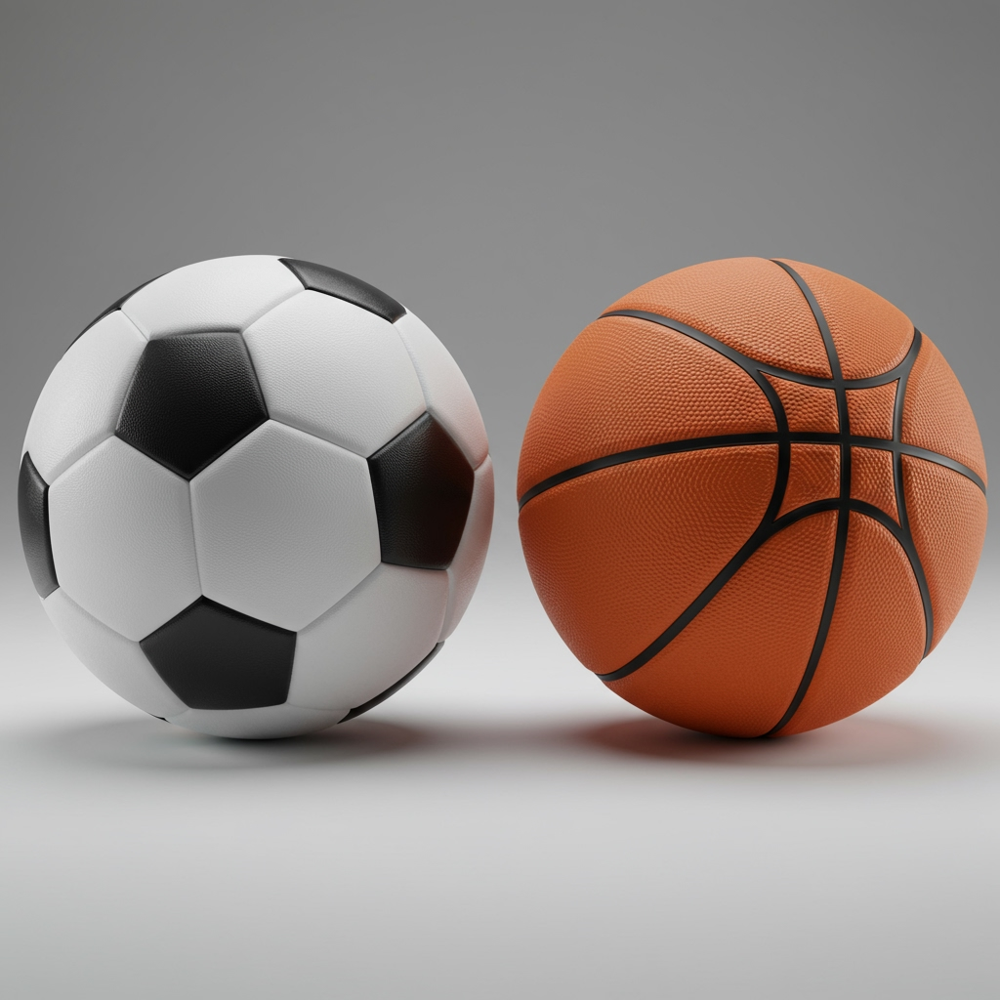
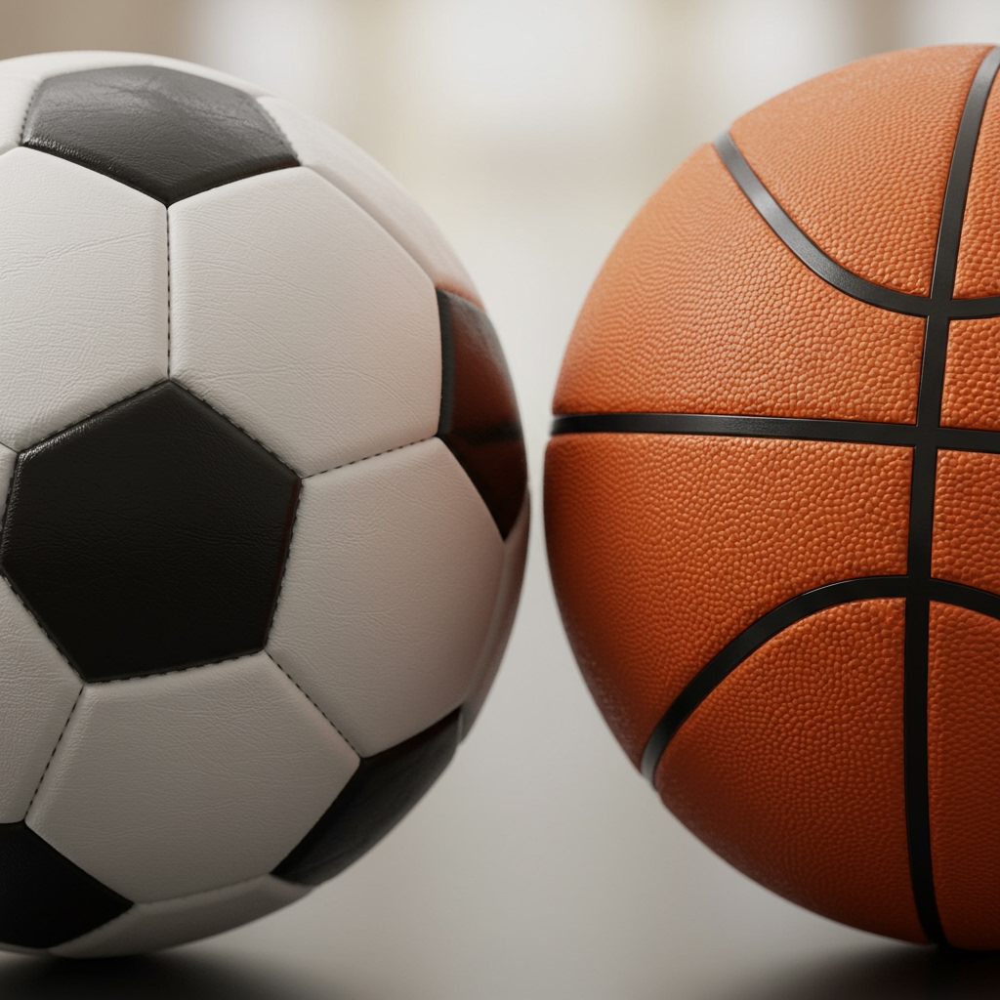

In [66]:
for ball in ball_data:
    display_images(ball['images'])

### Handling Generated Images

The generated images can now be used to test classification methods with Gemini.

Here I show how to convert the generated images into inputs for Gemini prompts by separating out an example image with a single ball and one with multiple balls:

In [126]:
type(ball_data[0]['images'][0].image)

google.genai.types.Image

In [149]:
single_ball_image = ball_data[0]['images'][0]
single_ball_example = genai.types.Part.from_bytes(
    data = single_ball_image.image.image_bytes,
    mime_type = single_ball_image.image.mime_type
)

In [150]:
multi_ball_image = ball_data[-1]['images'][0]
multi_ball_example = genai.types.Part.from_bytes(
    data = multi_ball_image.image.image_bytes,
    mime_type = multi_ball_image.image.mime_type
) 


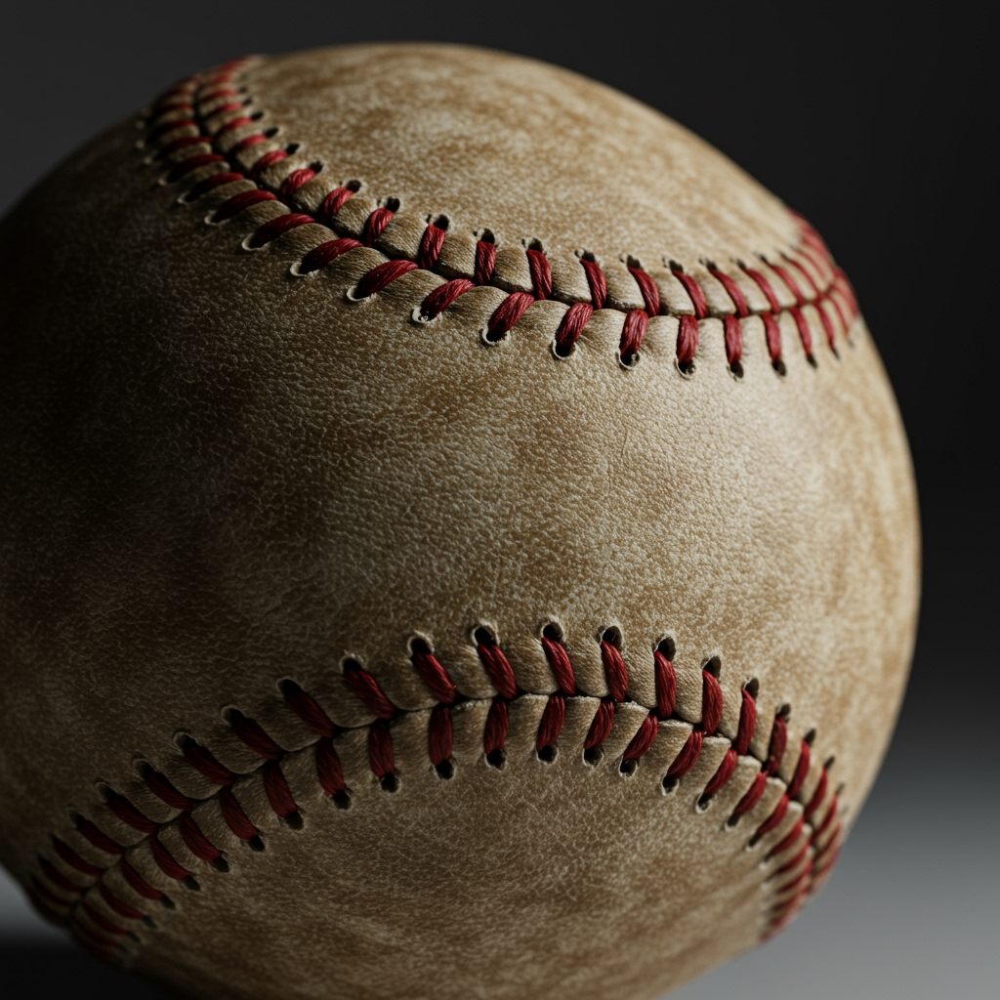
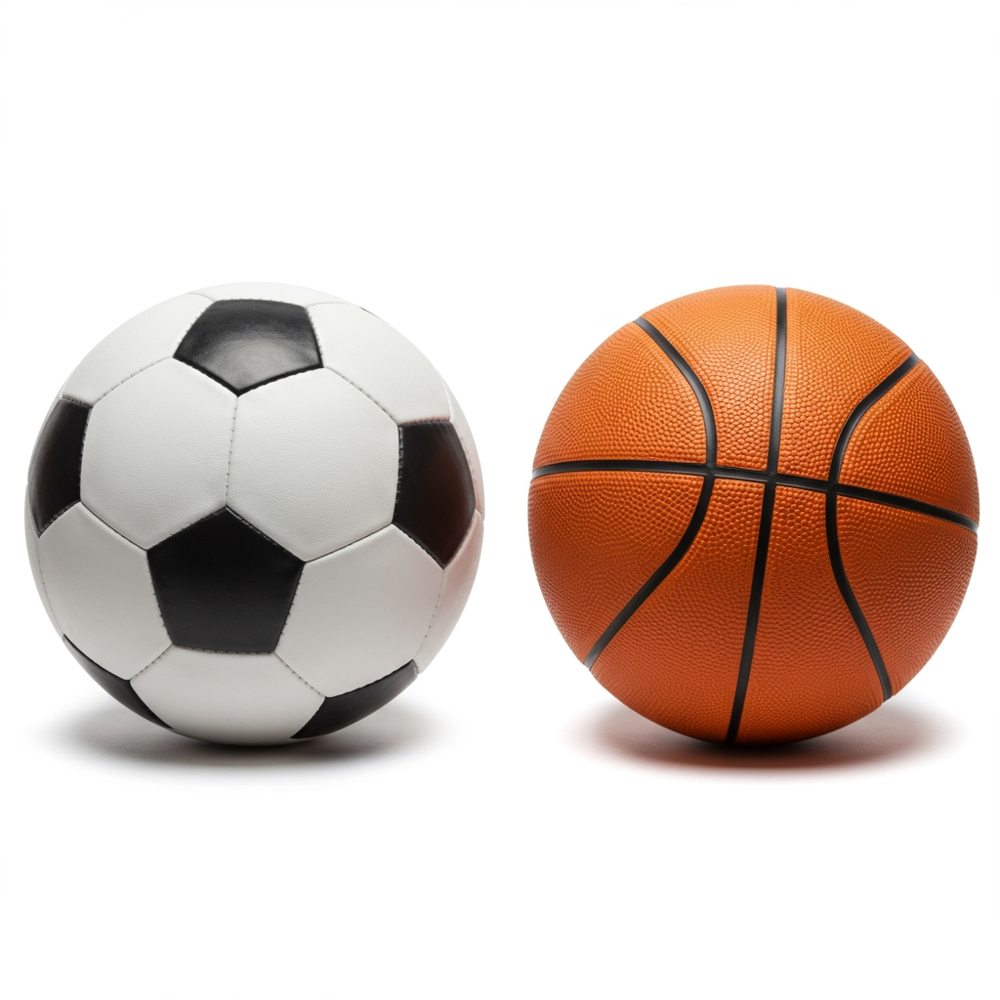

In [151]:
display_images([single_ball_image, multi_ball_image])

---
## Gemini Models

With the `google.genai` package the desired model is directly passed to the client.  Here is a structure of recent Flash and Pro Gemini models for 1.5 and 2.0 to reference:

In [154]:
models = {
    "gemini": {
        "pro": {
            "1.5": "gemini-1.5-pro-002",
            "2.0": "gemini-2.0-pro-exp-02-05"
        },
        "flash": {
            "1.5": "gemini-1.5-flash-002",
            "2.0": "gemini-2.0-flash-001"
        }
    }
}

---
## Classification - Single-Label

Testing methods of having Gemini label which sport the ball in an image is from.  For cases where multiple types could be present in the same image check out the next section `Classification - Multi-Label`.

### Zero-Shot

Just providing an image with a text prompt can do ok if the object is fairly common, like the sports balls here.  Notice in the example here that it correctly labels the balls in the single and multi examples.  The structure of the output might be a bit tricky to parse if the goals is to count the classifications though.

In [156]:
genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [single_ball_example, 'What sport is this from?'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
    )
).text

'This is a baseball.\n'

In [157]:
genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [multi_ball_example, 'What sport is this from?'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
    )
).text

'The image shows a soccer ball and a basketball. So, the sports are soccer and basketball.\n'

### Zero-Shot Controlled

We can constrain, or control, the output of Gemini.  Here an enum is created for all the types of balls we want to classify.  The enum is passed directly to Gemini as the `response_schema` and the output is controlled with `response_mime_type = 'textx.enum'` so that Geminni will only reply with one of the enum values we defined. **BUT** how about the image with multiple answers?  This approach only output a single value and misses the second ball.  The next section will extend to multi-label classification!

In [130]:
class BallEnum(str, enum.Enum):
    BASEBALL = 'Baseball'
    SOCCER = 'Soccer'
    FOOTBALL = 'American Football'
    GOLF = 'Golf'
    BASKETBALL = 'Basketball'

In [158]:
response = genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [single_ball_example, 'What sport is this from?'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
        response_mime_type = 'text/x.enum',
        response_schema = BallEnum
    )
)
response.text

'Baseball'

In [159]:
response = genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [multi_ball_example, 'What sport is this from?'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
        response_mime_type = 'text/x.enum',
        response_schema = BallEnum
    )
)
response.text

'Soccer'

## Classification - Multi-Label

This approach extends the enum controlled response approach above by defining a JSON schema with Pydantic.  Instead of responding with a single enum value it will now respond in JSON with a single key `balls` with values of the enum in an array/list.

### Zero-Shot Controlled

In [172]:
class MultiLabel(pydantic.BaseModel):
    balls: typing.List[BallEnum]

In [192]:
response = genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [single_ball_example, 'What sport is this from?'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
        response_mime_type = 'application/json',
        response_schema = MultiLabel
    )
)
response.text

'{\n  "balls": [\n    "Baseball"\n  ]\n}'

In [193]:
json.loads(response.text)

{'balls': ['Baseball']}

In [195]:
response = genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [multi_ball_example, 'What sport is this from?'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
        response_mime_type = 'application/json',
        response_schema = MultiLabel
    )
)
response.text

'{\n  "balls": [\n    "Soccer",\n    "Basketball"\n  ]\n}'

In [196]:
json.loads(response.text)

{'balls': ['Soccer', 'Basketball']}

### All The Images Classified

Cycle through the images and compare the actual label(s) to the predicted classifications:

In [179]:
def classifier(ball_data):
    for ball in ball_data:
        ball['zero-shot-controlled'] = []
        print(f"\nActual: {', '.join(ball['types'])}")
        print(f"Predicted:")
        for example in ball['images']:
            image = genai.types.Part.from_bytes(
                data = example.image.image_bytes,
                mime_type = example.image.mime_type
            )
            response = genai_client.models.generate_content(
                model = models['gemini']['flash']['2.0'],
                contents = [image, 'What sport is this from?'],
                config = genai.types.GenerateContentConfig(
                    temperature = 0,
                    response_mime_type = 'application/json',
                    response_schema = MultiLabel
                )
            )
            results = json.loads(response.text)
            ball['zero-shot-controlled'].append(results)
            print(f"- {results['balls']}")

classifier(ball_data)


Actual: baseball
Predicted:
- ['Baseball']
- ['Baseball']
- ['Baseball']
- ['Baseball']

Actual: american football
Predicted:
- ['American Football']
- ['American Football']
- ['American Football']
- ['American Football']

Actual: soccer
Predicted:
- ['Soccer']
- ['Soccer']
- ['Soccer']
- ['Soccer']

Actual: basketball
Predicted:
- ['Basketball']
- ['Basketball']
- ['Basketball']
- ['Basketball']

Actual: golf
Predicted:
- ['Golf']
- ['Golf']
- ['Golf']
- ['Golf']

Actual: baseball, golf
Predicted:
- ['Baseball', 'Golf']
- ['Baseball', 'Golf']
- ['Baseball', 'Golf']
- ['Baseball', 'Golf']

Actual: soccer, basketball
Predicted:
- ['Soccer', 'Basketball']
- ['Soccer', 'Basketball']
- ['Soccer', 'Basketball']
- ['Soccer', 'Basketball']


---
## Detection

Now the classification is handled for single-label and multi-label cases lets extend the work by adding detection.  Detection means identifying where in the image the object was found and outputing the coordinates of a bounding box that encapsulates the detection.

In [212]:
class Detection(pydantic.BaseModel):
    ball_type: BallEnum
    bounding_box: typing.List[int]

class MultiLabelDetection(pydantic.BaseModel):
    balls: typing.List[Detection]

In [213]:
response = genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [single_ball_example, 'Identify each sports ball in this image and include boudning boxes for each in the format [y_min, x_min, y_max, x_max].'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
        response_mime_type = 'application/json',
        response_schema = MultiLabelDetection
    )
)
json.loads(response.text)

{'balls': [{'ball_type': 'Baseball', 'bounding_box': [0, 0, 999, 999]}]}

In [214]:
response = genai_client.models.generate_content(
    model = models['gemini']['flash']['2.0'],
    contents = [multi_ball_example, 'Identify each sports ball in this image and include boudning boxes for each in the format [y_min, x_min, y_max, x_max].'],
    config = genai.types.GenerateContentConfig(
        temperature = 0,
        response_mime_type = 'application/json',
        response_schema = MultiLabelDetection
    )
)
json.loads(response.text)

{'balls': [{'ball_type': 'Soccer', 'bounding_box': [110, 24, 449, 330]},
  {'ball_type': 'Basketball', 'bounding_box': [134, 369, 455, 669]}]}

### Overlay Detection On Images


**STILL TROUBLESHOOTING**

In [208]:
pil_image = PIL.Image.open(io.BytesIO(multi_ball_image.image.image_bytes))

In [209]:
draw = PIL.ImageDraw.Draw(pil_image)

In [210]:
font = ImageFont.load_default()

In [219]:
for ball in json.loads(response.text)['balls']:
    width, height = pil_image.size
    y_min, x_min, y_max, x_max = ball['bounding_box']
    x_min = int((x_min/1000.0)*width)
    y_min = int((y_min/1000.0)*height)
    x_max = int((x_max/1000.0)*width)
    y_max = int((y_max/1000.0)*height)
    
    draw.rectangle(
        ((x_min, y_min), (x_max, y_max)),
        outline = 'red',
        width = 3
    )
    draw.text(
        (x_min, y_min - 20),
        ball['ball_type'],
        fill = 'red',
        font = font
    )

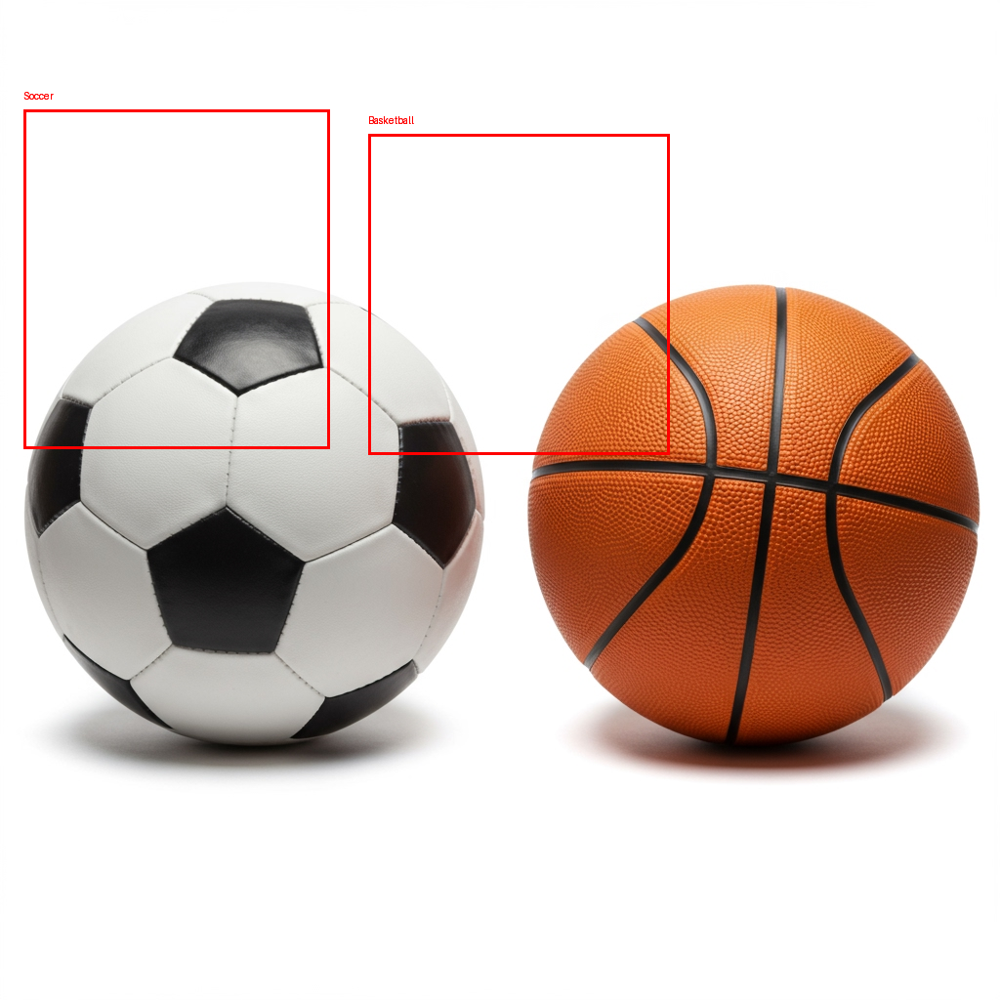

In [220]:
pil_image

---
## Extending These Concepts

- Multi-Shot Examples included in the prompts
- Optimizing Prompts with examples
- Supervised Fine Tuning on examples